In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import cv2
import glob
import pickle
from Calibration import Calibration
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

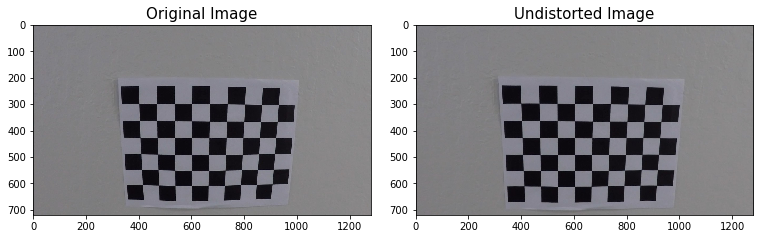

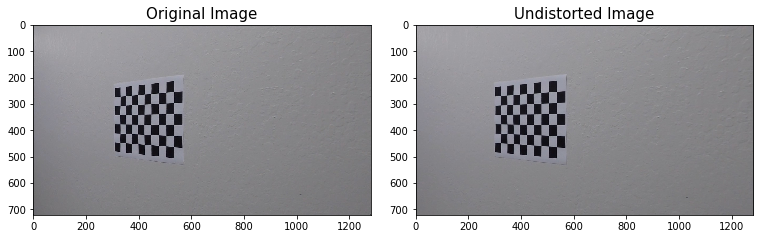

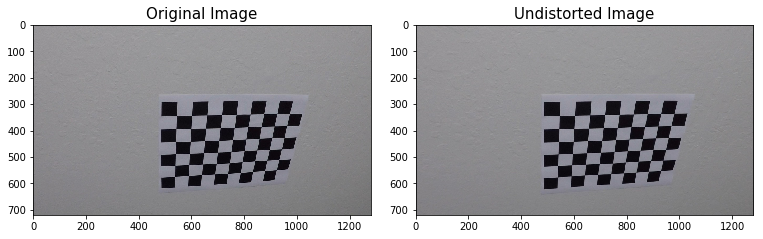

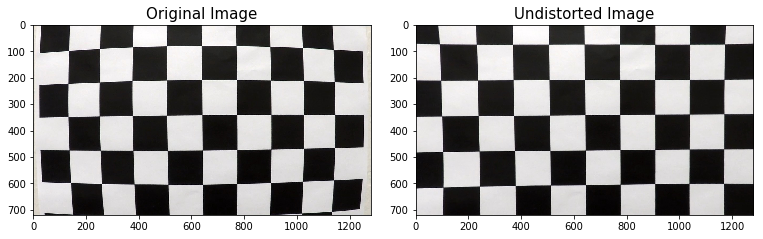

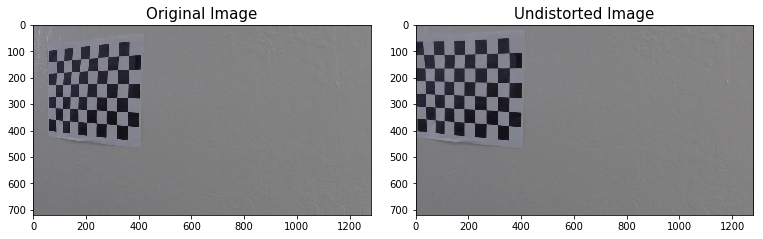

...

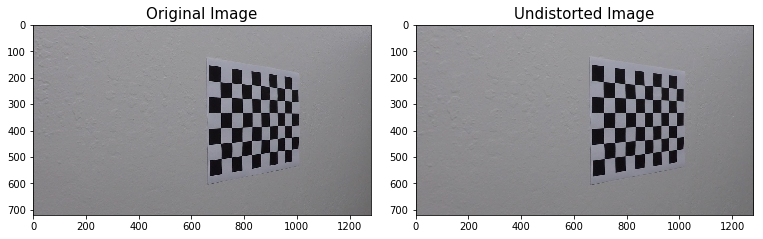

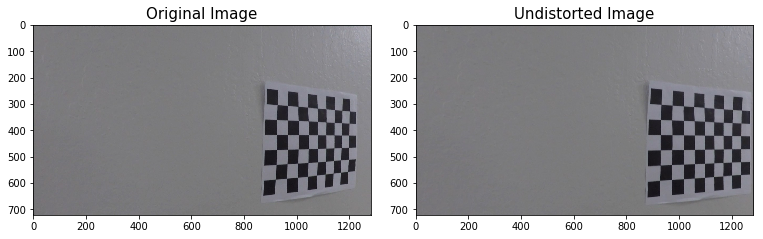

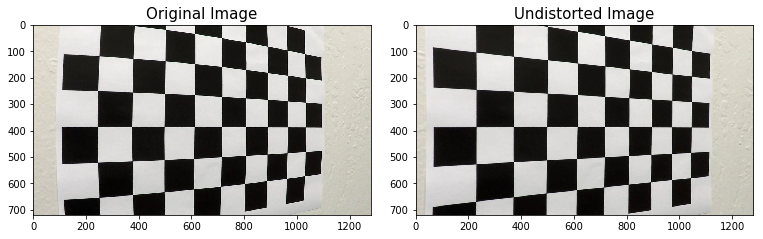

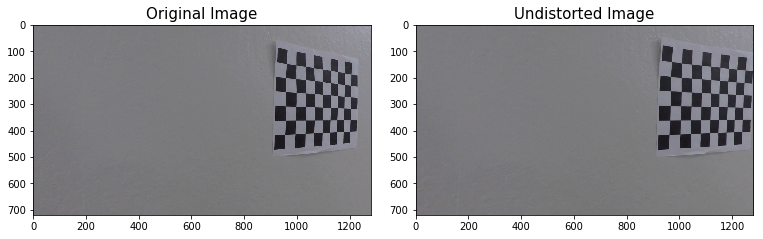

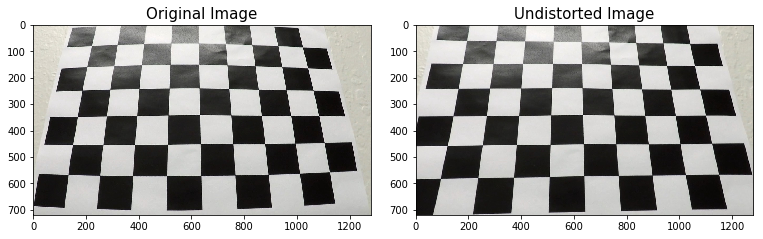

In [11]:
nx = 9
ny = 6
image_path = glob.glob('camera_cal/calibration*.jpg')
calibration = Calibration(nx=nx, ny=ny, image_paths=image_path)

for fname in image_path:
    _ = calibration.plot_images(fname)

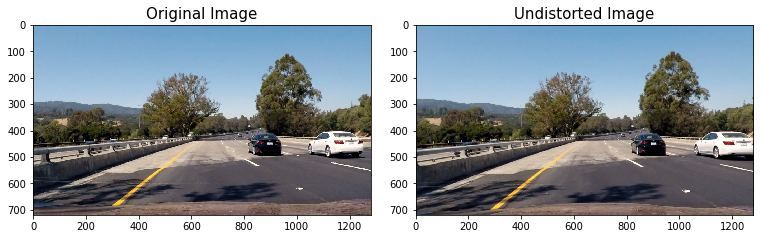

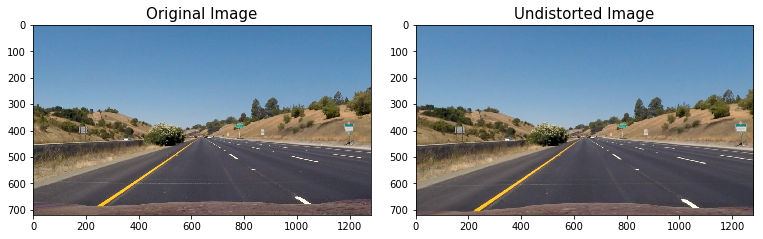

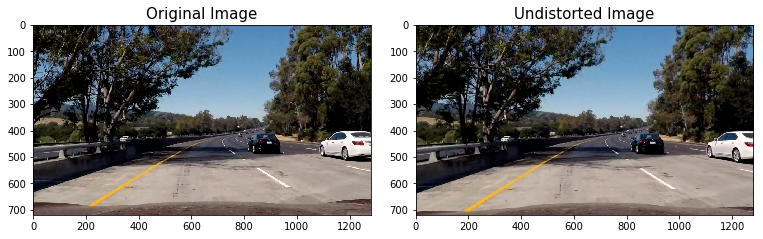

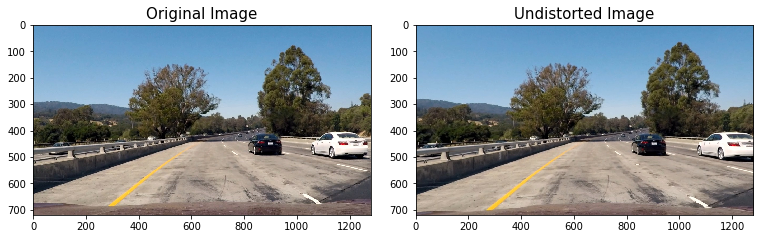

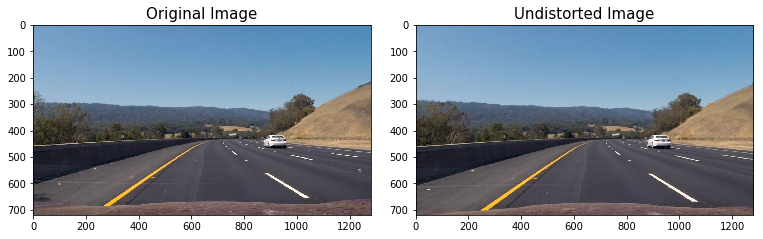

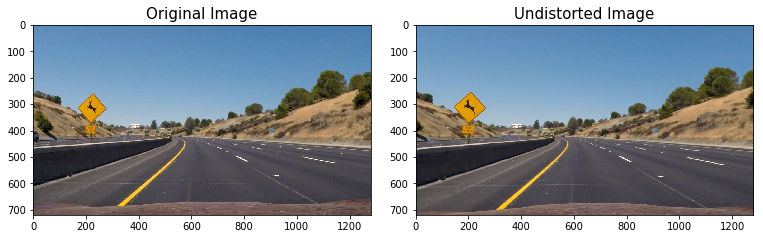

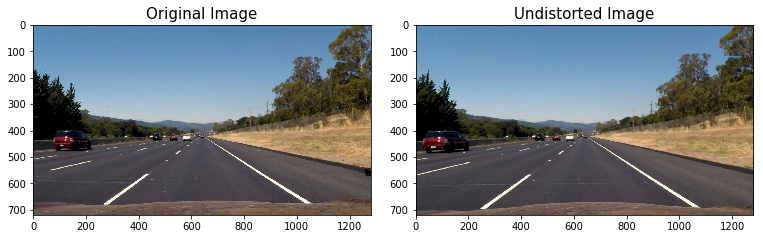

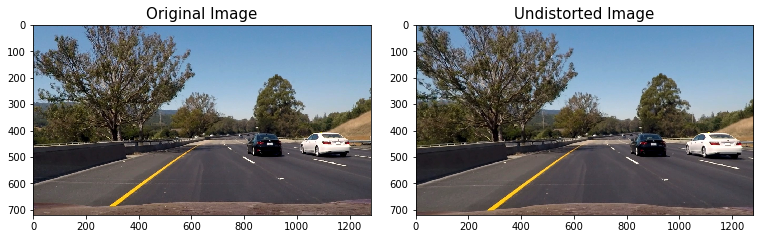

In [3]:
undist_images = []
images = glob.glob('./test_images/*.jpg')
for fname in images:
    undist_img = calibration.plot_images(fname)
    undist_images.append(undist_img)

In [4]:
def abs_sobel(img, kernel=3):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if img.ndim ==3 else img
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=kernel)
    return np.abs(sobel_x), np.abs(sobel_y)

def abs_sobel_threshold(img, orient='x', kernel=3, threshold=(0, 255)):
    sobel_x, sobel_y = abs_sobel(img, kernel=kernel)
    sobel = sobel_x if orient=='x' else sobel_y
    scaled_sobel = np.uint8(255*sobel / np.max(sobel))
    binary = np.zeros_like(scaled_sobel)
    binary[(scaled_sobel >= threshold[0]) & (scaled_sobel <= threshold[1])] = 1
    return binary

def magnitude_threshold(img, kernel=3, threshold=(0, 255)):
    sobel_x, sobel_y = abs_sobel(img, kernel=kernel)
    magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    scaled_magnitude = np.uint8(255*magnitude / np.max(magnitude))
    binary = np.zeros_like(scaled_magnitude)
    binary[(scaled_magnitude >= threshold[0]) & (scaled_magnitude <= threshold[1])] = 1
    return binary

def direction_threshold(img, kernel=3, threshold=(0, 255)):
    sobel_x, sobel_y = abs_sobel(img, kernel=kernel)
    direction = np.arctan2(sobel_y, sobel_x)
    binary = np.zeros_like(direction)
    binary[(direction >= threshold[0]) & (direction <= threshold[1])] = 1
    return binary

def lab_threshold(img, l_yellow, h_yellow, l_white, h_white):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    yellow = cv2.inRange(lab, l_yellow, h_yellow)
    white = cv2.inRange(lab, l_white, h_white)
    mask = cv2.bitwise_or(yellow, white)
    res = cv2.bitwise_and(img, img, mask=mask)
    return mask, res

def color_threshold(img):
    lower_yellow = np.array([0, 0 , 80])
    upper_yellow = np.array([255, 255, 110])
    lower_white = np.array([196, 0, 0])
    upper_white = np.array([255, 255, 255])
    mask, lab = lab_threshold(img, lower_yellow, upper_yellow, lower_white, upper_white)
    return mask, lab

In [5]:
img = undist_images[5]
gradx = abs_sobel_threshold(img, 'x', kernel=3, threshold=(30, 100))
grady = abs_sobel_threshold(img, 'y', kernel=3, threshold=(30, 100))
magnitude_binary = magnitude_threshold(img, kernel=3, threshold=(30, 100))
direction_binary = direction_threshold(img, kernel=5, threshold=(0.70, 1.30))

binary = np.zeros_like(gradx)
binary[((gradx == 1) & (grady == 1)) | ((magnitude_binary == 1) & (direction_binary == 1))] = 1

color, res = color_threshold(img)
stack_binary = np.dstack((np.zeros_like(binary), binary*255, color))
combined_binary = np.zeros_like(binary)
combined_binary[(binary==1) & (color==255)] = 1

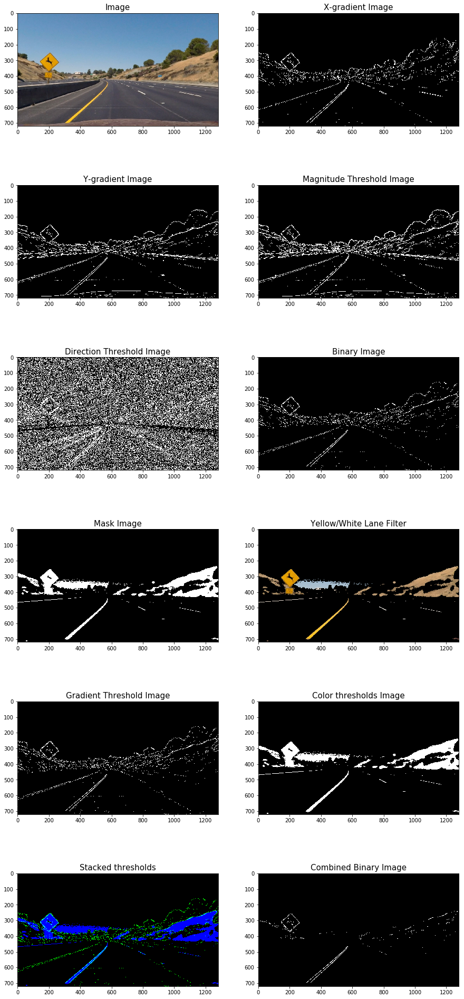

In [6]:
f, [[ax1, ax2], [ax3, ax4], [ax5, ax6], [ax7, ax8], [ax9, ax10], [ax11, ax12]] = plt.subplots(6, 2, figsize=(15, 35))
ax1.set_title('Image', fontsize=15)
ax1.imshow(img, cmap='gray')

ax2.set_title('X-gradient Image', fontsize=15)
ax2.imshow(gradx, cmap='gray')

ax3.set_title('Y-gradient Image', fontsize=15)
ax3.imshow(grady, cmap='gray')

ax4.set_title('Magnitude Threshold Image', fontsize=15)
ax4.imshow(magnitude_binary, cmap='gray')

ax5.set_title('Direction Threshold Image', fontsize=15)
ax5.imshow(direction_binary, cmap='gray')

ax6.set_title('Binary Image', fontsize=15)
ax6.imshow(binary, cmap='gray')

ax7.set_title('Mask Image', fontsize=15)
ax7.imshow(color, cmap='gray')
    
ax8.set_title('Yellow/White Lane Filter', fontsize=15)
ax8.imshow(res, cmap='gray')

ax9.set_title('Gradient Threshold Image', fontsize=15)
ax9.imshow(binary, cmap='gray')
    
ax10.set_title('Color thresholds Image', fontsize=15)
ax10.imshow(color, cmap='gray')

ax11.set_title('Stacked thresholds', fontsize=15)
ax11.imshow(stack_binary, cmap='gray')

ax12.set_title('Combined Binary Image', fontsize=15)
ax12.imshow(combined_binary, cmap='gray')

plt.show()

In [7]:
def combined_thresholds(img):
    gradx = abs_sobel_threshold(img, 'x', kernel=3, threshold=(30, 100))
    grady = abs_sobel_threshold(img, 'y', kernel=3, threshold=(30, 100))
    magnitude_binary = magnitude_threshold(img, kernel=3, threshold=(30, 100))
    direction_binary = direction_threshold(img, kernel=15, threshold=(0.70, 1.30))

    binary = np.zeros_like(gradx)
    binary[((gradx == 1) & (grady == 1)) | ((magnitude_binary == 1) & (direction_binary == 1))] = 1

    color, res = color_threshold(img)
    combined_binary = np.zeros_like(binary)
    combined_binary[(binary==1) & (color==255)] = 1
    return combined_binary

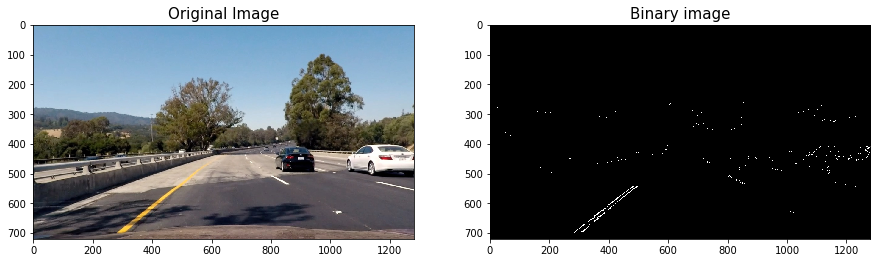

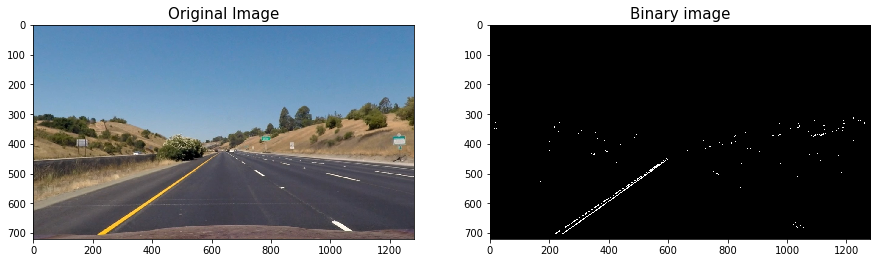

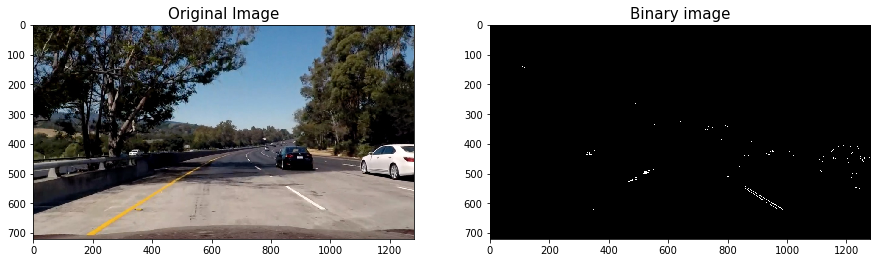

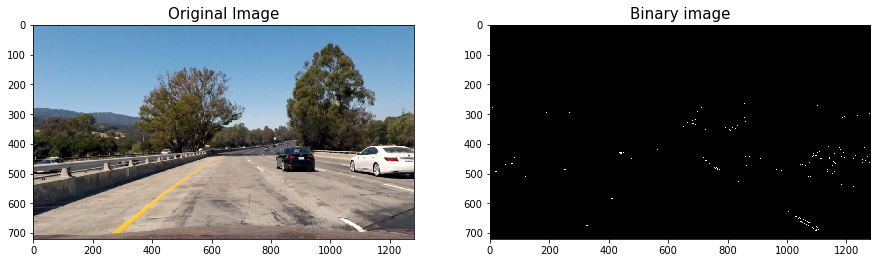

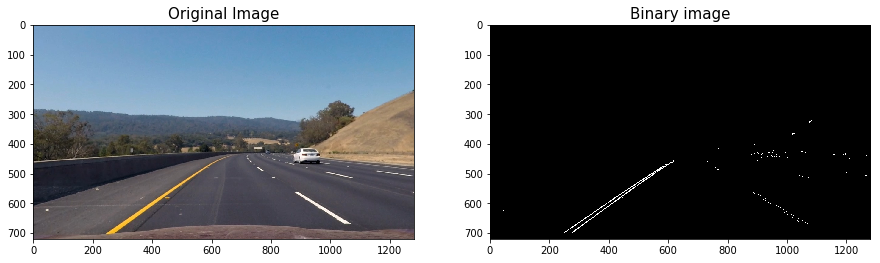

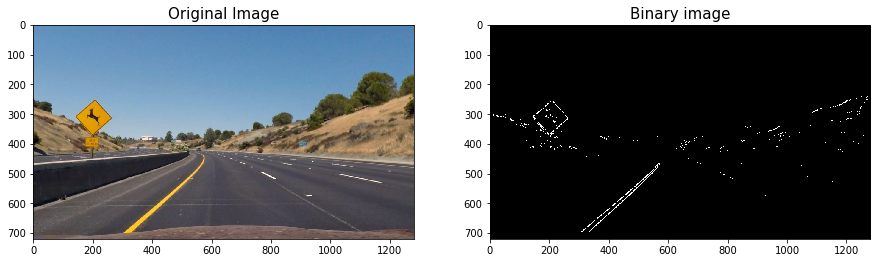

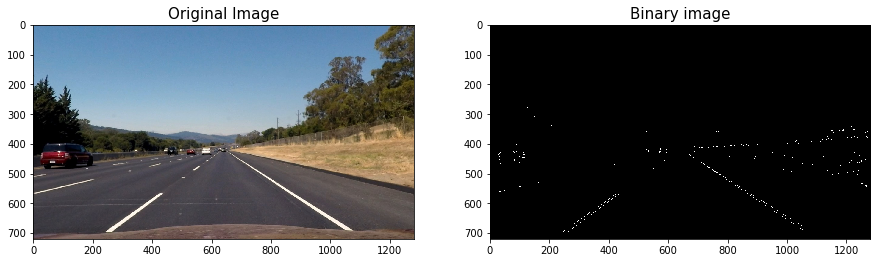

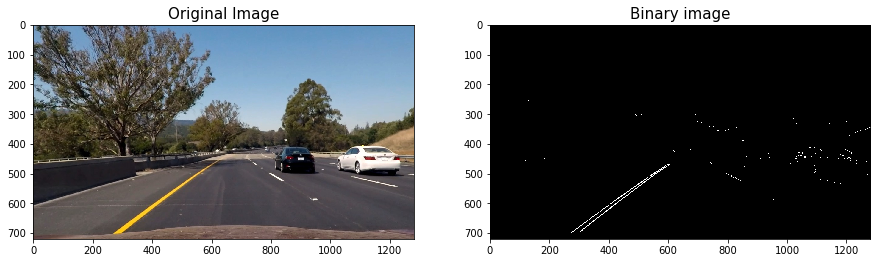

In [8]:
binary_images = []
for img in undist_images:
    binary_image = combined_thresholds(img)
    binary_images.append(binary_image)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,4))

    ax1.set_title('Original Image', fontsize=15)
    ax1.imshow(img)

    ax2.set_title('Binary image', fontsize=15)
    ax2.imshow(binary_image, cmap='gray')
    plt.show()

(1280, 720)


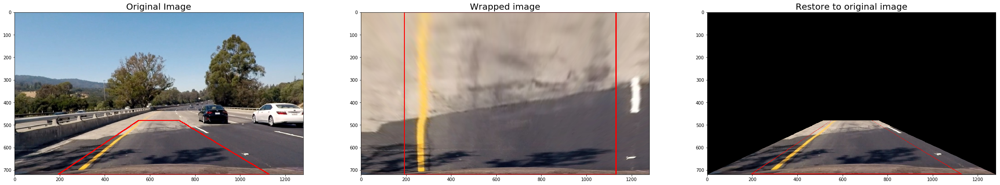

In [9]:
img = undist_images[0]

copy = np.copy(img)
image_size = (img.shape[1], img.shape[0])
print(image_size)
xLen = copy.shape[1]
yLen = copy.shape[0]
src = np.float32([[0.15*xLen, yLen], [(0.5 * xLen) - (xLen*0.07), (2/3)*yLen], [(0.5 * xLen) + (xLen*0.07), (2/3)*yLen], [xLen-150, yLen]])
dst = np.float32([[0.15*xLen, yLen], [0.15*xLen, 0], [xLen-150, 0], [xLen-150, yLen]])

lines_o = cv2.polylines(copy, np.int32([src]), True, (255, 0, 0), 3)

M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
image_size = (img.shape[1], img.shape[0])
warped = cv2.warpPerspective(img, M, image_size, cv2.INTER_LINEAR)

# Draw lines
lines_w = cv2.polylines(warped, np.int32([dst]), True, (255, 0, 0), 3)

# Restore to original image
restore_img = cv2.warpPerspective(warped, Minv, image_size, cv2.INTER_LINEAR)

# Plotting Wrapped images
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(40,20))

ax1.set_title('Original Image', fontsize=20)
ax1.imshow(lines_o)

ax2.set_title('Wrapped image', fontsize=20)
ax2.imshow(lines_w)

ax3.set_title('Restore to original image', fontsize=20)
ax3.imshow(restore_img)

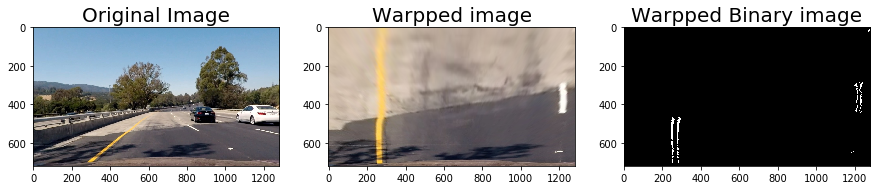

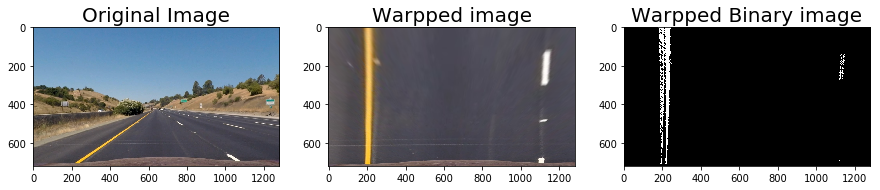

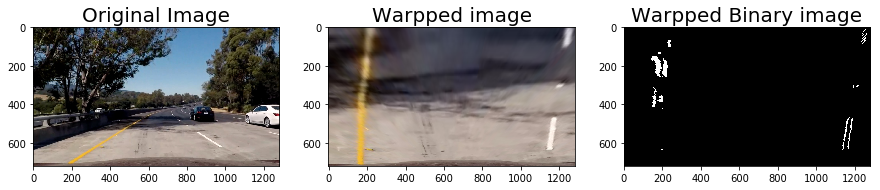

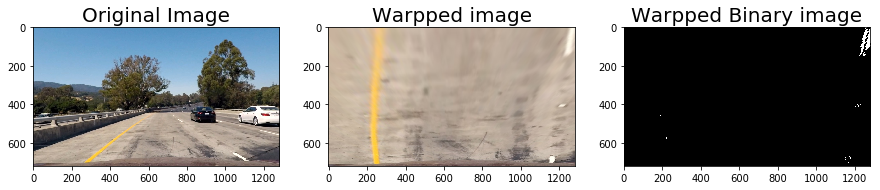

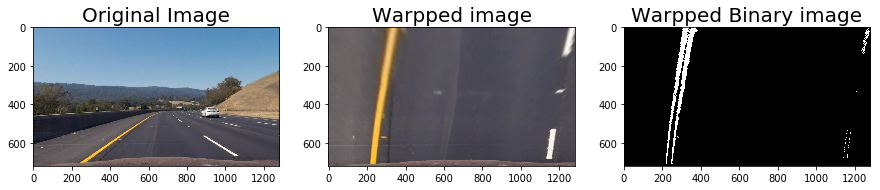

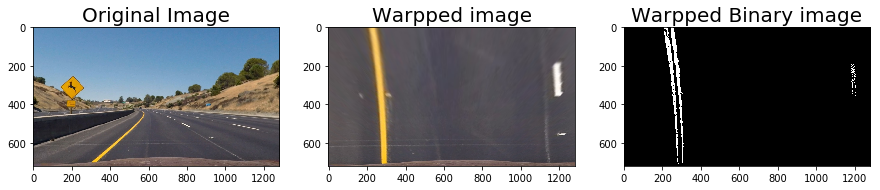

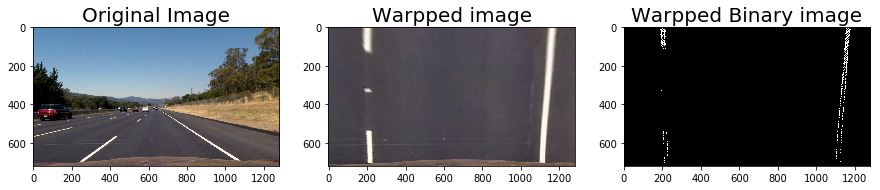

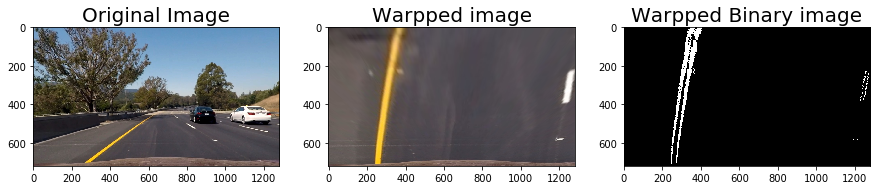

In [10]:

# Warp onto birds-eye-view
# Previous region-of-interest mask's function is absorbed by the warp
warp_images = []
warp_binary_images = []
for i in range(len(undist_images)):
    image = undist_images[i]
    image_size = (image.shape[1], image.shape[0])
    warped = cv2.warpPerspective(image, M, image_size, cv2.INTER_LINEAR)
    warp_images.append(warped)
    
    binary_image = binary_images[i]
    binary_warped = cv2.warpPerspective(binary_image, M, image_size, cv2.INTER_LINEAR)
    warp_binary_images.append(binary_warped)
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,6))

    ax1.set_title('Original Image', fontsize=20)
    ax1.imshow(image)

    ax2.set_title('Warpped image', fontsize=20)
    ax2.imshow(warped)

    ax3.set_title('Warpped Binary image', fontsize=20)
    ax3.imshow(binary_warped, cmap='gray')